In [27]:
!nvidia-smi

Thu May  4 00:57:22 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.30.02              Driver Version: 530.30.02    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce GTX 1050 Ti      On | 00000000:01:00.0 Off |                  N/A |
|  0%   27C    P8               N/A /  72W|     40MiB /  4096MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [28]:
import os
HOME = os.getcwd()
print(HOME)

/home/medo/yolov8_training_on_sku110K


## Install YOLOv8

In [29]:
!nvidia-smi

Thu May  4 00:57:22 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.30.02              Driver Version: 530.30.02    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce GTX 1050 Ti      On | 00000000:01:00.0 Off |                  N/A |
|  0%   27C    P8               N/A /  72W|     40MiB /  4096MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [30]:
import os
HOME = os.getcwd()
print(HOME)

/home/medo/yolov8_training_on_sku110K


In [31]:
# Pip install method (recommended)
#!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.91 🚀 Python-3.8.16 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce GTX 1050 Ti, 4036MiB)
Setup complete ✅ (4 CPUs, 15.6 GB RAM, 136.5/437.6 GB disk)


In [32]:
# Git clone method (for development)

# %cd {HOME}
# !git clone github.com/ultralytics/ultralytics
# %cd {HOME}/ultralytics
# !pip install -e .

# from IPython import display
# display.clear_output()

# import ultralytics
# ultralytics.checks()

In [33]:
from ultralytics import YOLO

from IPython.display import display, Image
from pathlib import Path

In [34]:
#!mkdir {HOME}/datasets
#%cd {HOME}/datasets

#!pip install roboflow --quiet

#from roboflow import Roboflow
#rf = Roboflow(api_key="YOUR_API_KEY")
#project = rf.workspace("roboflow-jvuqo").project("football-players-detection-3zvbc")
#dataset = project.version(1).download("yolov8")

## Custom Training

In [35]:
logger = 'Comet' #@param ['Comet', 'ClearML', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'ClearML':
  %pip install -q clearml
  import clearml; clearml.browser_login()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir runs/train

Note: you may need to restart the kernel to use updated packages.


In [36]:
DATASET_DIR = "../yolov5_training_on_sku110K/SKU110K_fixed"
YAML_FILE_PATH = Path(DATASET_DIR) / "data_kaggle.yaml"
!cat $YAML_FILE_PATH

# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: /home/medo/yolov5_training_on_sku110K/SKU110K_fixed/images/  # dataset root dir
train: train  # train images (relative to 'path')  8219 images
val: val  # val images (relative to 'path')  588 images
test: test  # test images (optional)  2936 images

# Classes
nc: 1  # number of classes
names: ['object']  # class names

### With img size 640

In [37]:
# retrain for imgsz 640
# initial run
#!yolo task=detect mode=train batch=3 model=yolov8m.pt data={YAML_FILE_PATH} project=my_yolov8_640_model epochs=1 imgsz=640 plots=True save=True exist_ok=True
# more epochs...
!yolo task=detect mode=train batch=3 model={HOME}/my_yolov8_640_model/train/weights/best.pt data={YAML_FILE_PATH} project=my_yolov8_640_model epochs=30 imgsz=640 plots=True save=True exist_ok=True

Ultralytics YOLOv8.0.91 🚀 Python-3.8.16 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce GTX 1050 Ti, 4036MiB)
yolo/engine/trainer: task=detect, mode=train, model=/home/medo/yolov8_training_on_sku110K/my_yolov8_640_model/train/weights/best.pt, data=../yolov5_training_on_sku110K/SKU110K_fixed/data_kaggle.yaml, epochs=30, patience=50, batch=3, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=my_yolov8_640_model, name=None, exist_ok=True, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=Non

### With img size 512

In [13]:
%cd {HOME}
#!yolo task=detect mode=train batch=3 model=./my_yolov8_model/train/weights/best.pt data={YAML_FILE_PATH} project=my_yolov8_model epochs=30 imgsz=500 plots=True save=True exist_ok=True resume=./my_yolov8_model/train/weights/last.pt
#model=yolov8s.pt

/home/medo/yolov8_training_on_sku110K


In [14]:
!ls {HOME}/my_yolov8_model/train/

args.yaml					      P_curve.png
confusion_matrix.png				      PR_curve.png
events.out.tfevents.1683063918.debianotebook.9135.0   R_curve.png
events.out.tfevents.1683065342.debianotebook.9436.0   results.csv
events.out.tfevents.1683067331.debianotebook.9753.0   results.png
events.out.tfevents.1683067394.debianotebook.9847.0   train_batch0.jpg
events.out.tfevents.1683068049.debianotebook.10148.0  train_batch1.jpg
events.out.tfevents.1683068104.debianotebook.10240.0  train_batch2.jpg
events.out.tfevents.1683068201.debianotebook.10359.0  val_batch0_labels.jpg
events.out.tfevents.1683108976.debianotebook.13347.0  val_batch0_pred.jpg
events.out.tfevents.1683109117.debianotebook.13927.0  val_batch1_labels.jpg
events.out.tfevents.1683109181.debianotebook.14209.0  val_batch1_pred.jpg
events.out.tfevents.1683109302.debianotebook.14664.0  val_batch2_labels.jpg
F1_curve.png					      val_batch2_pred.jpg
labels_correlogram.jpg				      weights
labels.jpg


In [15]:
%cd {HOME}
#Image(filename=f'{HOME}/my_yolov8_model/train/confusion_matrix.png', width=600)

/home/medo/yolov8_training_on_sku110K


In [16]:
%cd {HOME}
#Image(filename=f'{HOME}/my_yolov8_model/train/results.png', width=600)

/home/medo/yolov8_training_on_sku110K


In [17]:
%cd {HOME}
#Image(filename=f'{HOME}/my_yolov8_model/train/val_batch0_pred.jpg', width=600)

/home/medo/yolov8_training_on_sku110K


## Validate Custom Model

In [18]:
%cd {HOME}
#!yolo task=detect mode=val model={HOME}/my_yolov8_model/train/weights/best.pt data={YAML_FILE_PATH}

/home/medo/yolov8_training_on_sku110K


## Inference with Custom Model

### Batch Test

In [19]:
%cd {HOME}
#!yolo task=detect mode=predict model={HOME}/my_yolov8_model/train/weights/best.pt conf=0.25 source=../yolov5_training_on_sku110K/SKU110K_fixed/images/test save=True

/home/medo/yolov8_training_on_sku110K


**NOTE:** Let's take a look at few results.

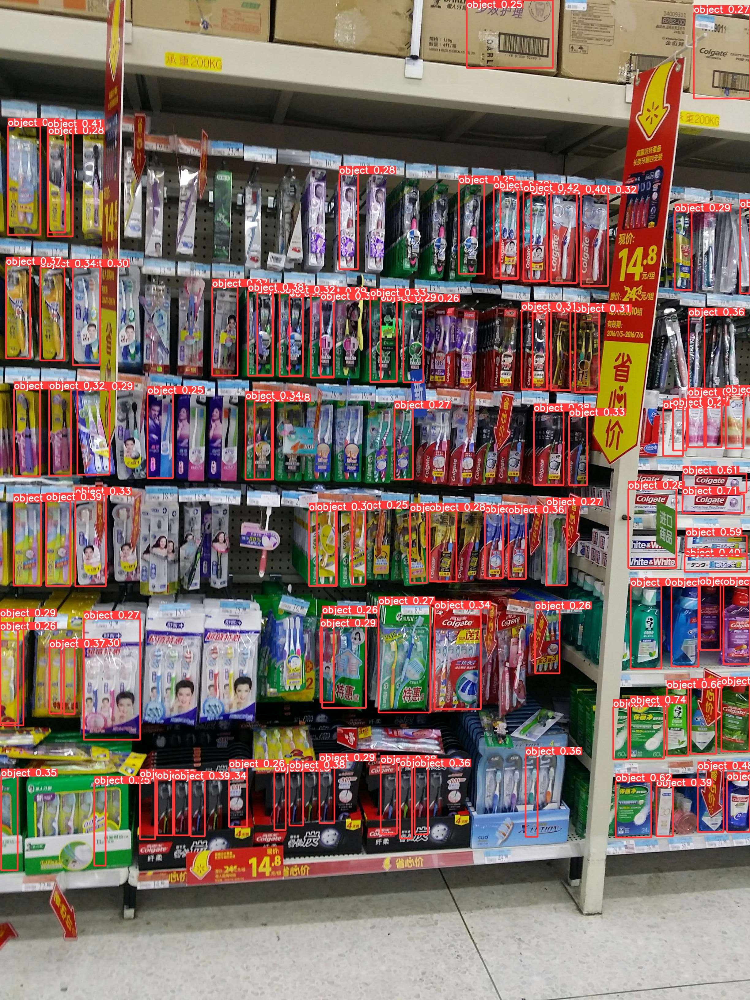

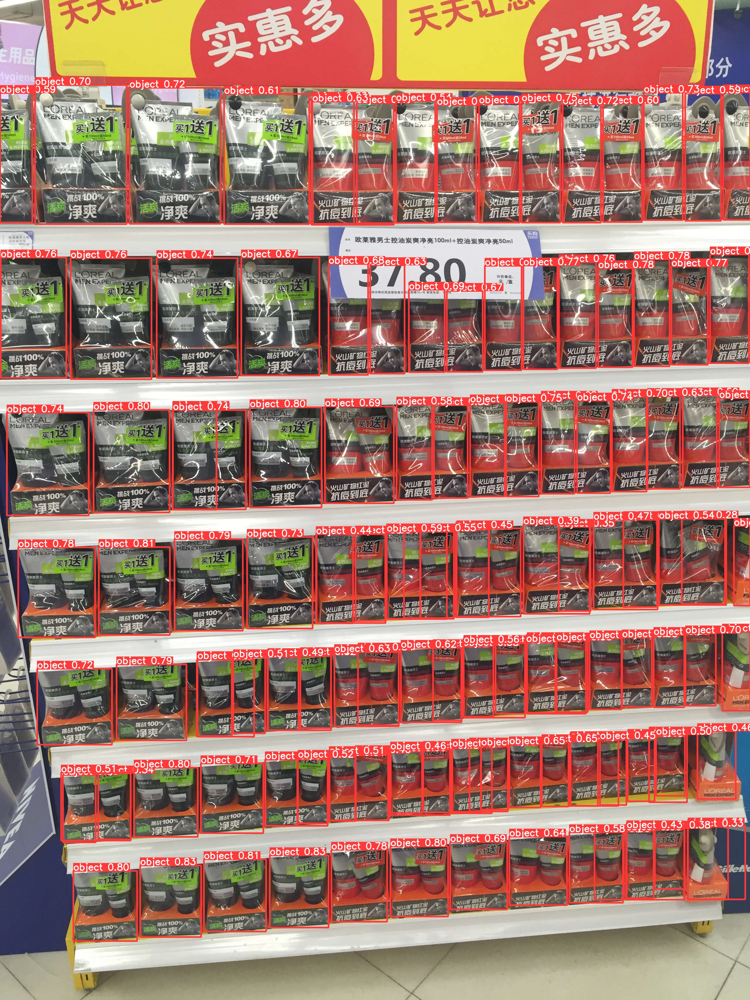

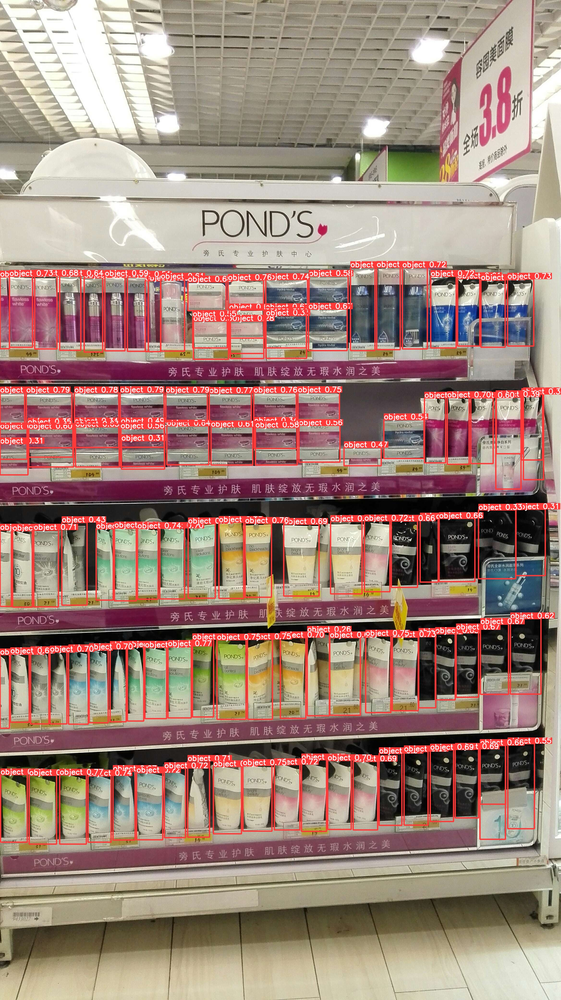

In [20]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict5/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

### Recorded Video

In [21]:
!yolo task=detect mode=predict model={HOME}/my_yolov8_640_model/train/weights/best.pt conf=0.25 source=./test_files/medo_fridge.mp4 save=True

Ultralytics YOLOv8.0.91 🚀 Python-3.8.16 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce GTX 1050 Ti, 4036MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs

video 1/1 (1/333) /home/medo/yolov8_training_on_sku110K/test_files/medo_fridge.mp4: 640x384 3 objects, 41.8ms
video 1/1 (2/333) /home/medo/yolov8_training_on_sku110K/test_files/medo_fridge.mp4: 640x384 4 objects, 38.1ms
video 1/1 (3/333) /home/medo/yolov8_training_on_sku110K/test_files/medo_fridge.mp4: 640x384 3 objects, 38.2ms
video 1/1 (4/333) /home/medo/yolov8_training_on_sku110K/test_files/medo_fridge.mp4: 640x384 5 objects, 34.5ms
video 1/1 (5/333) /home/medo/yolov8_training_on_sku110K/test_files/medo_fridge.mp4: 640x384 7 objects, 34.5ms
video 1/1 (6/333) /home/medo/yolov8_training_on_sku110K/test_files/medo_fridge.mp4: 640x384 6 objects, 34.4ms
video 1/1 (7/333) /home/medo/yolov8_training_on_sku110K/test_files/medo_fridge.mp4: 640x384 5 objects, 33.6ms
video 1/1 (8/333) /home/medo/yolov8_training_

In [22]:
from IPython.display import Video

Video("runs/detect/predict8/medo_fridge.mp4")

### Fridge Image

In [23]:
!yolo task=detect mode=predict model={HOME}/my_yolov8_model/train/weights/best.pt conf=0.25 source=./test_files/fridge_haul.jpeg save=True save_crop=True

Ultralytics YOLOv8.0.91 🚀 Python-3.8.16 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce GTX 1050 Ti, 4036MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs

image 1/1 /home/medo/yolov8_training_on_sku110K/test_files/fridge_haul.jpeg: 384x512 18 objects, 32.2ms
Speed: 1.6ms preprocess, 32.2ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict10


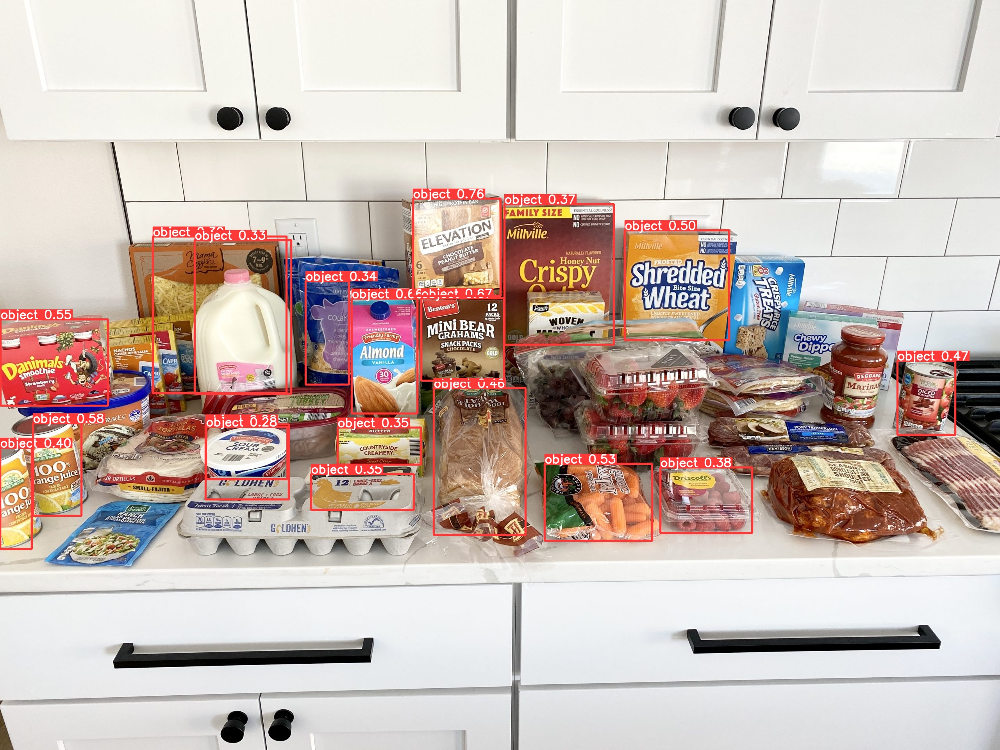

In [24]:
for image_path in glob.glob(f'{HOME}/runs/detect/predict7/*.jpeg')[:3]:
    display(Image(filename=image_path, width=600))
    print("\n")

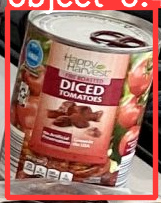

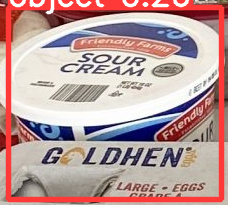

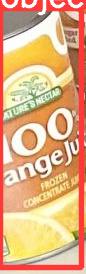

In [25]:
for image_path in glob.glob(f'{HOME}/runs/detect/predict7/crops/object/*.jpg')[:3]:
    display(Image(filename=image_path, width=600))
    print("\n")